In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import imutils 

In [2]:
def display_image(image, title="Image Viewer"):
    """
    Display an image in a Jupyter Notebook with a given title.

    Args:
        image (numpy.ndarray): Image array loaded using OpenCV or another library.
        title (str): Title for the displayed image.
    """
    
    # Display the image using Matplotlib
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.title(title)  # Add the specified title
    plt.axis("on")   # Hide or shor axis values
    plt.show()

# Images

## Display image

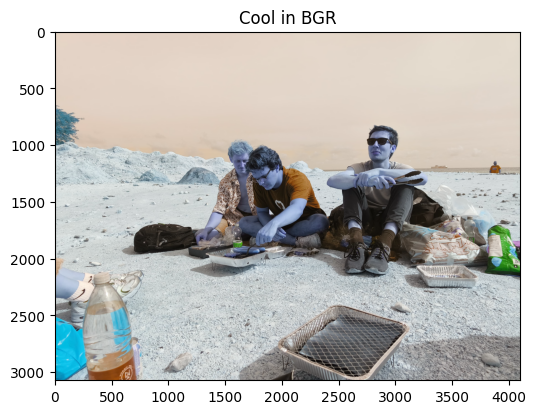

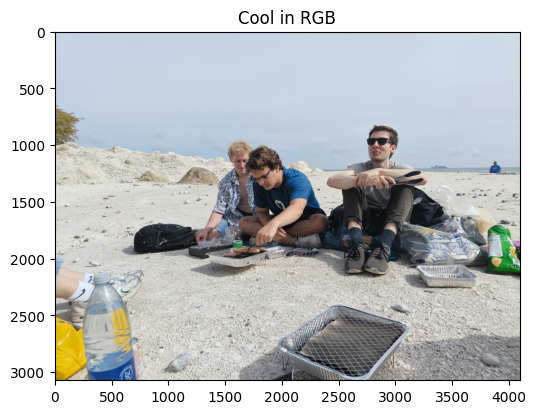

In [3]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Display original image
display_image(image, title="Cool in BGR")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image
display_image(image_rgb, title="Cool in RGB")

## Data indexing 

In [4]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Data indexing
pixel = [1500, 1500]

# Get the pixel value at the specified index
pixel_value = image_rgb[pixel[0], pixel[1]]

# Display the pixel value
print(f"Pixel value at index {pixel}: {pixel_value}") # In RGB

Pixel value at index [1500, 1500]: [10 23 55]


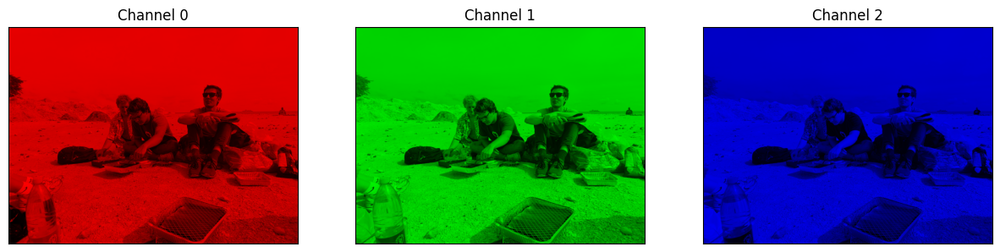

In [5]:
# Display R, G and B images
plt.figure(figsize=(15, 5))

for i in range(3):
    channel = np.zeros_like(image)
    channel[:,:,i] = image[:,:,i]
    plt.subplot(1,3,i+1), plt.imshow(channel)
    plt.title(f"Channel {i}"), plt.xticks([]), plt.yticks([])
    plt.xticks([]),plt.yticks([])
plt.show()

## Crop image

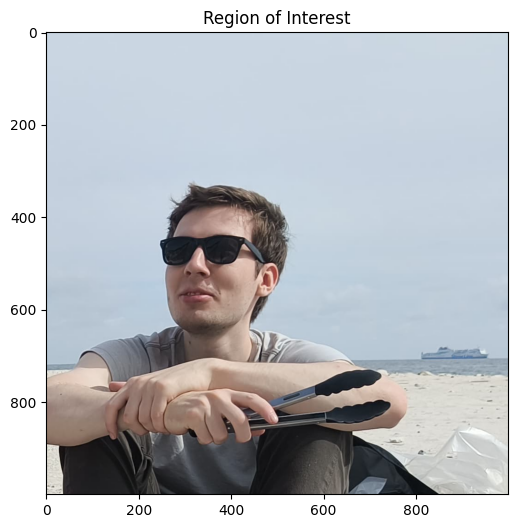

In [6]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# ROI
roi = image_rgb[500:1500, 2500:3500]

# Display the ROI
display_image(roi, title="Region of Interest")

## Resize the image

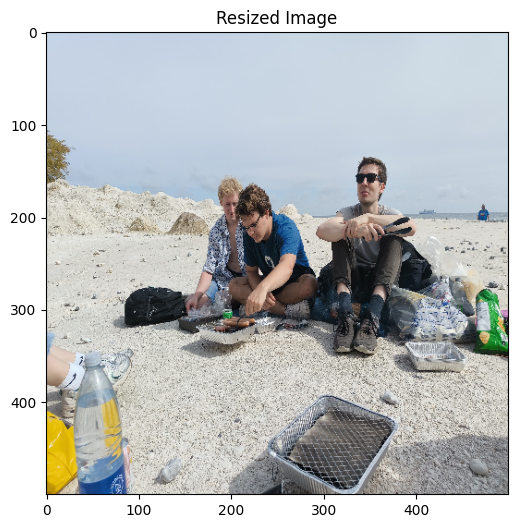

In [7]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize the image
image_resized = cv2.resize(image_rgb, (500, 500))

# Display the resized image
display_image(image_resized, title="Resized Image")

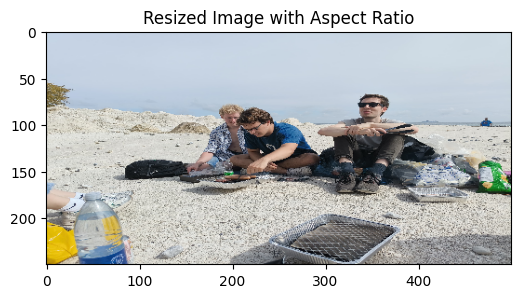

In [8]:
# Resize maintaining aspect ratio
aspect_ratio = 2
width = 500
height = int(width / aspect_ratio)

# Resize the image
image_resized = cv2.resize(image_rgb, (width, height))

# Display the resized image
display_image(image_resized, title="Resized Image with Aspect Ratio")

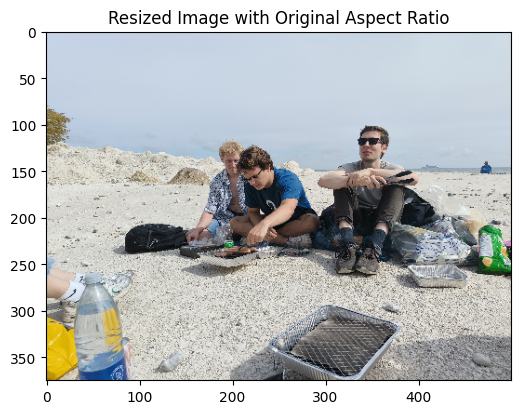

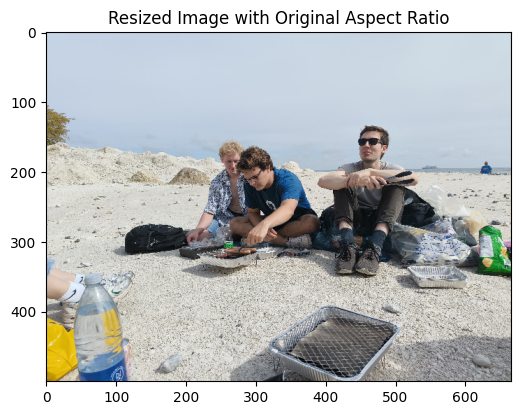

In [9]:
# Resize maintaining original aspect ratio of the image
width = 500
height = int(image_rgb.shape[0] / image_rgb.shape[1] * width)

# Resize the image
image_resized = cv2.resize(image_rgb, (width, height))

# Display the resized image
display_image(image_resized, title="Resized Image with Original Aspect Ratio")

# Other dimension
height = 500
width = int(image_rgb.shape[1] / image_rgb.shape[0] * height)

# Resize the image
image_resized = cv2.resize(image_rgb, (width, height))

# Display the resized image
display_image(image_resized, title="Resized Image with Original Aspect Ratio")

## Rotation

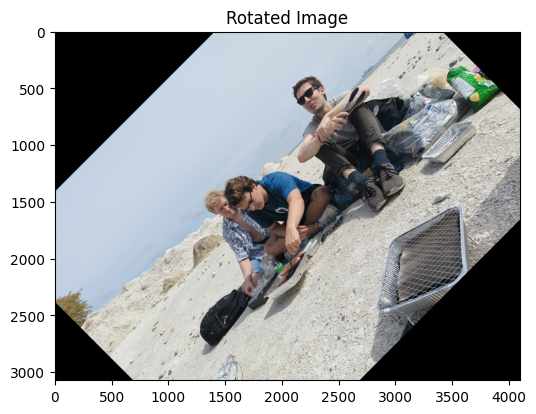

In [10]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Rotate the image
angle = 45
image_rotated = imutils.rotate(image_rgb, angle)

# Display the rotated image
display_image(image_rotated, title="Rotated Image")

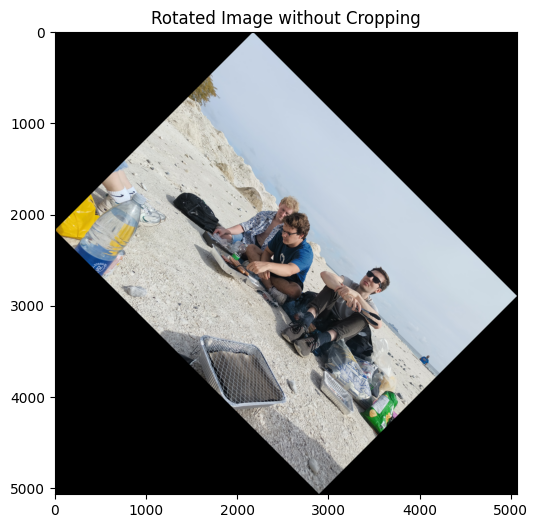

In [11]:
# Rotation withou cropping
image_rotated = imutils.rotate_bound(image_rgb, angle)

# Display the rotated image
display_image(image_rotated, title="Rotated Image without Cropping")

## Apply Kernels to image (correlation)

In [12]:
def apply_kernel(image, kernel):
    """
    Apply a kernel (filter) to an image with correlation.

    Args:
        image (numpy.ndarray): Input image.
        kernel (numpy.ndarray): Correlation kernel (filter).

    Returns:
        numpy.ndarray: Image after applying the kernel.
    """
    # Validate inputs
    if image is None or not isinstance(image, np.ndarray):
        raise ValueError("Invalid image. Must be a numpy.ndarray.")
    if kernel is None or not isinstance(kernel, np.ndarray):
        raise ValueError("Invalid kernel. Must be a numpy.ndarray.")
    
    # Apply the kernel using OpenCV's filter2D function
    #filtered_image = cv2.filter2D(src=image, ddepth=-1, kernel=kernel)
    filtered_image = cv2.filter2D(src=image, ddepth=-1, kernel=kernel, borderType=cv2.BORDER_CONSTANT)
    
    return filtered_image

In [13]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

### Mean kernel

Kernel:
[[9.80296e-05 9.80296e-05 9.80296e-05 ... 9.80296e-05 9.80296e-05
  9.80296e-05]
 [9.80296e-05 9.80296e-05 9.80296e-05 ... 9.80296e-05 9.80296e-05
  9.80296e-05]
 [9.80296e-05 9.80296e-05 9.80296e-05 ... 9.80296e-05 9.80296e-05
  9.80296e-05]
 ...
 [9.80296e-05 9.80296e-05 9.80296e-05 ... 9.80296e-05 9.80296e-05
  9.80296e-05]
 [9.80296e-05 9.80296e-05 9.80296e-05 ... 9.80296e-05 9.80296e-05
  9.80296e-05]
 [9.80296e-05 9.80296e-05 9.80296e-05 ... 9.80296e-05 9.80296e-05
  9.80296e-05]]


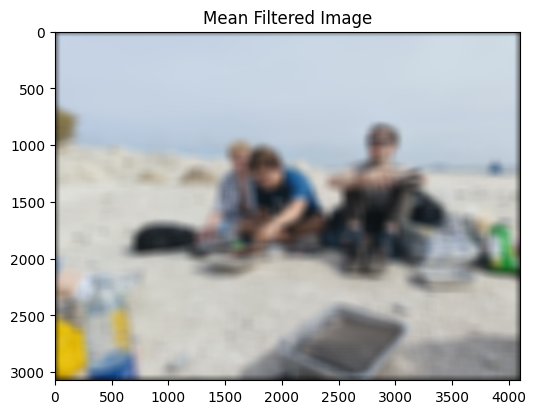

In [14]:
# Mean filter
kernel_size = 101
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size**2)

# Print the kernel
print(f"Kernel:\n{kernel}")

# Apply the kernel to the image
image_filtered = apply_kernel(image_rgb, kernel)

# Display the filtered image
display_image(image_filtered, title="Mean Filtered Image")


### Median

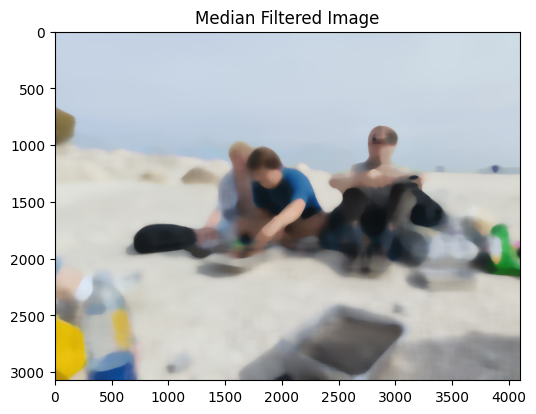

In [15]:
# Apply the median filter
kernel_size = 101  # Must be an ODD integer
median_filtered_image = cv2.medianBlur(image_rgb, ksize=kernel_size)

# Display the filtered image
display_image(median_filtered_image, title="Median Filtered Image")


### Gaussian

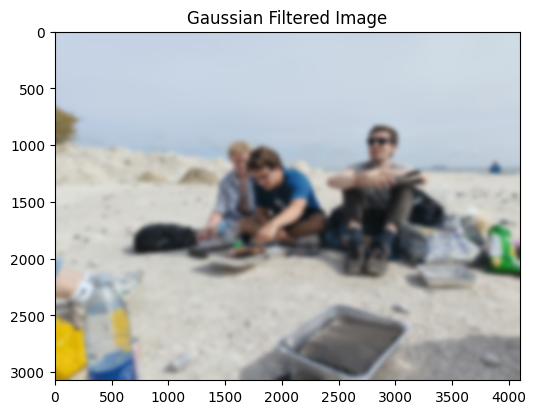

In [16]:
# Apply Gaussian filter
kernel_size = 101  # Should be an ODD integer
sigma = 20  # Standard deviation for the Gaussian kernel
gaussian_filtered_image = cv2.GaussianBlur(image_rgb, (kernel_size, kernel_size), sigma)

# Display the filtered image
display_image(gaussian_filtered_image, title="Gaussian Filtered Image")


## Apply Kernel to test image

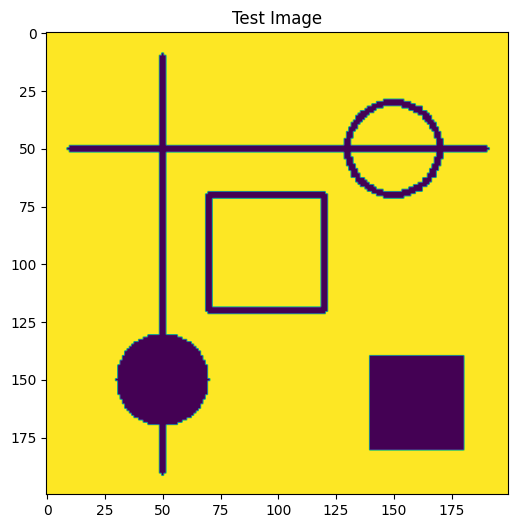

In [17]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def create_test_image():
    """
    Creates a test image with horizontal and vertical lines, and geometric shapes
    for testing 3x3 kernels.
    
    Returns:
        numpy.ndarray: Grayscale test image.
    """
    # Create a blank white image
    image = np.ones((200, 200), dtype=np.uint8) * 255  # 200x200 pixels, white background

    # Draw horizontal and vertical lines
    cv2.line(image, (10, 50), (190, 50), color=0, thickness=2)  # Horizontal line
    cv2.line(image, (50, 10), (50, 190), color=0, thickness=2)  # Vertical line

    # Draw rectangles
    cv2.rectangle(image, (70, 70), (120, 120), color=0, thickness=2)  # Hollow rectangle
    cv2.rectangle(image, (140, 140), (180, 180), color=0, thickness=-1)  # Filled rectangle

    # Draw circles
    cv2.circle(image, (150, 50), radius=20, color=0, thickness=2)  # Hollow circle
    cv2.circle(image, (50, 150), radius=20, color=0, thickness=-1)  # Filled circle

    return image

# Generate the test image
test_image = create_test_image()

# Display the test image
display_image(test_image, title="Test Image")

### Gradient kernels

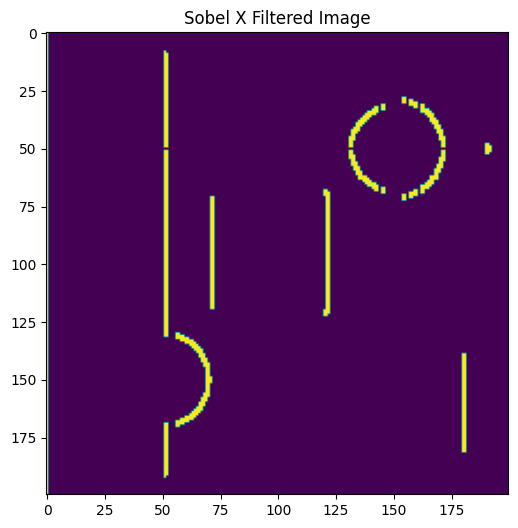

In [18]:
# X-axis Sobel kernel (Horizontal gradient, detects vertical edges)
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]], dtype=np.float32)

# Apply the kernel to the test image
sobel_x_image = apply_kernel(test_image, sobel_x)

# Display the filtered image
display_image(sobel_x_image, title="Sobel X Filtered Image")


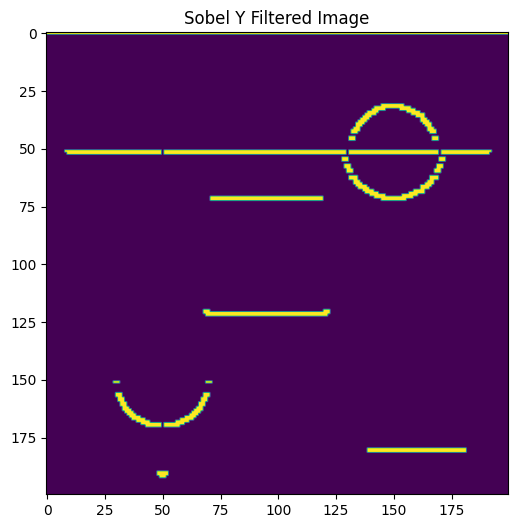

In [19]:
# Y-axis Sobel kernel (Vertical gradient, detects horizontal edges)
sobel_y = np.array([[-1, -2, -1],
                    [ 0,  0,  0],
                    [ 1,  2,  1]], dtype=np.float32)

# Apply the kernel to the test image
sobel_y_image = apply_kernel(test_image, sobel_y)

# Display the filtered image
display_image(sobel_y_image, title="Sobel Y Filtered Image")

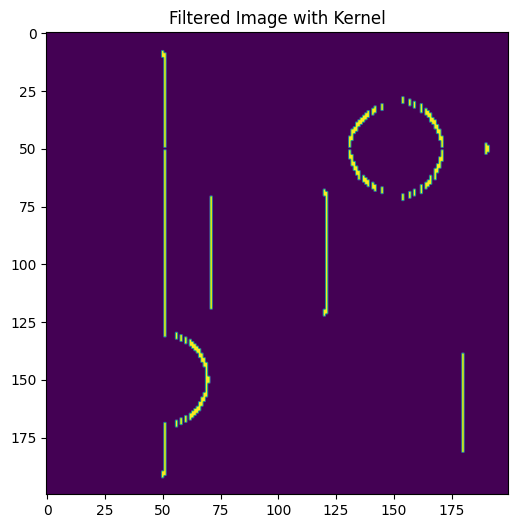

In [20]:
# Random kernel
kernel = np.array([[ 0, -1,  1],
                    [ 0, -1,  1],
                    [ 0, -1,  1]], dtype=np.float32)

# Apply the kernel to the test image
filtered_image = apply_kernel(test_image, kernel)

# Display the filtered image
display_image(filtered_image, title="Filtered Image with Kernel")

## Sharpening

In [21]:
import numpy as np

def generate_sharpening_kernel(alpha):
    """
    Generate a sharpening kernel based on the given alpha using the formula:
    f_sharp = ((1 + alpha) * w) - (alpha * v)

    Args:
        alpha (float): Strength of sharpening. Higher values increase sharpening.

    Returns:
        numpy.ndarray: Sharpening kernel.
    """
    # Identity kernel (w)
    w = np.array([[0, 0, 0],
                  [0, 1, 0],
                  [0, 0, 0]], dtype=np.float32)

    # Mean filter kernel (v)
    v = np.ones((3, 3), dtype=np.float32) / 9

    # Calculate the sharpening kernel
    sharpening_kernel = (1 + alpha) * w - alpha * v

    return sharpening_kernel


Sharpening Kernel:
[[-55.555557 -55.555557 -55.555557]
 [-55.555557 445.44446  -55.555557]
 [-55.555557 -55.555557 -55.555557]]


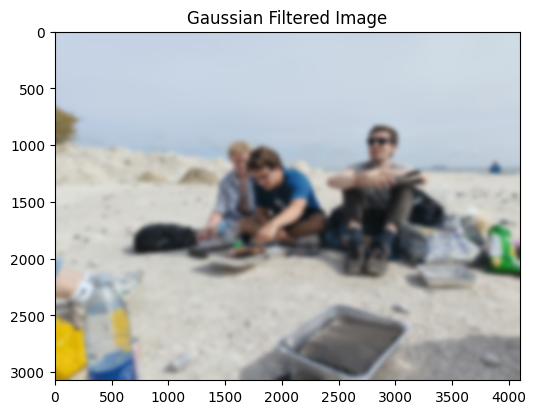

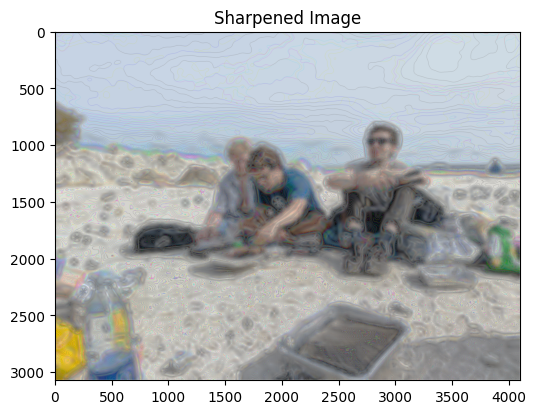

In [22]:
# Sharpening kernel
alpha = 500  # Sharpening strength
sharpen_kernel = generate_sharpening_kernel(alpha)

# Print the kernel
print("Sharpening Kernel:")
print(sharpen_kernel)

# Apply the kernel to gaussian_filtered_image
sharpened_image = apply_kernel(gaussian_filtered_image, sharpen_kernel)

# Gaussian filtered image
display_image(gaussian_filtered_image, title="Gaussian Filtered Image")

# Display the sharpened image
display_image(sharpened_image, title="Sharpened Image")

## Apply convolution

In [23]:
import numpy as np
import cv2

def apply_convolution(image, kernel):
    """
    Apply convolution to an image using a given kernel.

    Args:
        image (numpy.ndarray): Input image.
        kernel (numpy.ndarray): Convolution kernel.

    Returns:
        numpy.ndarray: Image after applying the convolution.
    """
    # Validate inputs
    if image is None or not isinstance(image, np.ndarray):
        raise ValueError("Invalid image. Must be a numpy.ndarray.")
    if kernel is None or not isinstance(kernel, np.ndarray):
        raise ValueError("Invalid kernel. Must be a numpy.ndarray.")

    # Flip the kernel both horizontally and vertically for convolution
    flipped_kernel = np.flipud(np.fliplr(kernel))

    # Apply the kernel using OpenCV's filter2D function
    convolved_image = cv2.filter2D(src=image, ddepth=-1, kernel=flipped_kernel, borderType=cv2.BORDER_CONSTANT)
    
    return convolved_image


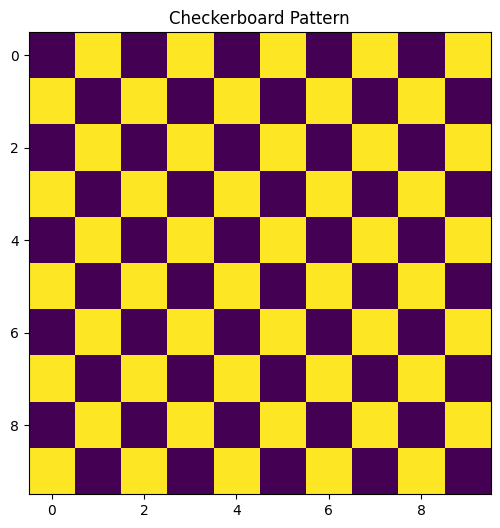

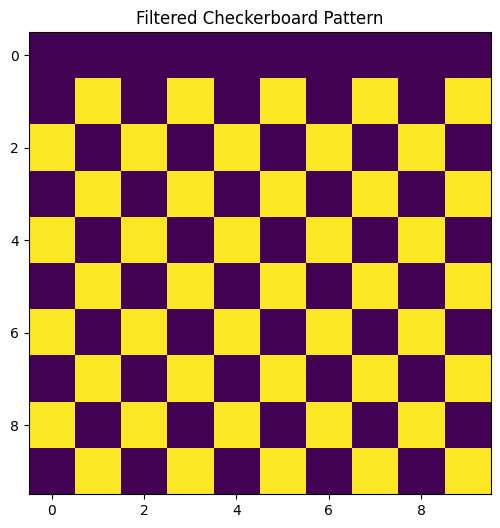

In [24]:
# Create a 10x10 checkerboard pattern
checkerboard = np.zeros((10, 10), dtype=np.uint8)
checkerboard[1::2, ::2] = 1  # Fill odd rows, even columns
checkerboard[::2, 1::2] = 1  # Fill even rows, odd columns

# Display the checkerboard pattern
display_image(checkerboard, title="Checkerboard Pattern")

# Apply convolution to checkerboard pattern
kernel = np.array([[0, 0, 0],
                   [0, 0, 0],
                   [0, 1, 0]], dtype=np.float32)

# Apply the kernel to the checkerboard pattern
filtered_checkerboard = apply_convolution(checkerboard, kernel)

# Display the filtered checkerboard pattern
display_image(filtered_checkerboard, title="Filtered Checkerboard Pattern")

# Hough Line Detection

Converting the image to grayscale for processing...
Applying Canny edge detection...
Canny edge detection parameters: threshold1=100, threshold2=200
Applying Hough Line Transform...
Hough Transform parameters: rho=1, theta=0.0017, threshold=200
Detected lines (rho, theta):
Number of lines detected: 32
Drawing the detected lines on the image...
Line 1: rho=-225.00, theta=2.7353, points=(-188, -1007) to (601, 829)
Line 2: rho=604.00, theta=0.3264, points=(251, 1140) to (892, -753)
Line 3: rho=-224.00, theta=2.7336, points=(-191, -1006) to (602, 829)
Line 4: rho=841.00, theta=1.1679, points=(-590, 1165) to (1249, 381)
Line 5: rho=-226.00, theta=2.7370, points=(-185, -1008) to (601, 830)
Line 6: rho=840.00, theta=1.1696, points=(-592, 1163) to (1248, 382)
Line 7: rho=363.00, theta=0.4080, points=(-63, 1061) to (729, -773)
Line 8: rho=257.00, theta=0.4403, points=(-193, 1014) to (658, -795)
Line 9: rho=232.00, theta=1.9125, points=(-1019, -116) to (864, 553)
Line 10: rho=367.00, theta=0.406

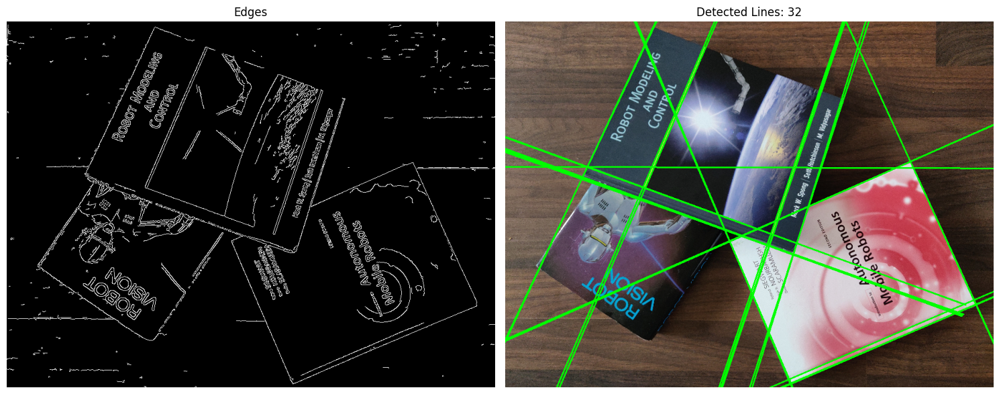

Successfully detected and drew 32 line(s) on the image.


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (ensure the file path is correct)
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_10\books.png')

# Step 1: Convert to grayscale
print("Converting the image to grayscale for processing...")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 2: Apply Canny edge detection
print("Applying Canny edge detection...")
threshold1 = 100  # Lower threshold for edges
threshold2 = 200  # Upper threshold for edges
edges = cv2.Canny(gray_image, threshold1=threshold1, threshold2=threshold2)
print(f"Canny edge detection parameters: threshold1={threshold1}, threshold2={threshold2}")

# Step 3: Apply Hough Line Transform
print("Applying Hough Line Transform...")
rho = 1  # Distance resolution of the accumulator in pixels
theta = 0.0017  # Angular resolution in radians
hough_threshold = 200  # Minimum number of votes for a line
lines = cv2.HoughLines(edges, rho=rho, theta=theta, threshold=hough_threshold)
print(f"Hough Transform parameters: rho={rho}, theta={theta}, threshold={hough_threshold}")
print("Detected lines (rho, theta):")

# Step 4: Count the number of lines detected
num_lines = 0 if lines is None else len(lines)
print(f"Number of lines detected: {num_lines}")

# Step 5: Draw the detected lines on a copy of the original image
print("Drawing the detected lines on the image...")
output_image = image.copy()
if lines is not None:
    for idx, line in enumerate(lines):
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(output_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        print(f"Line {idx + 1}: rho={rho:.2f}, theta={theta:.4f}, points=({x1}, {y1}) to ({x2}, {y2})")

# Step 6: Convert images to RGB for matplotlib (OpenCV uses BGR by default)
print("Preparing images for display...")
edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

# Step 7: Display images inline
print("Displaying the edges and detected lines...")
plt.figure(figsize=(15, 10))

# Show the edges
plt.subplot(1, 2, 1)
plt.imshow(edges_rgb)
plt.title('Edges')
plt.axis('off')

# Show the detected lines
plt.subplot(1, 2, 2)
plt.imshow(output_image_rgb)
plt.title(f'Detected Lines: {num_lines}')
plt.axis('off')

plt.tight_layout()
plt.show()

# Final printout
if num_lines > 0:
    print(f"Successfully detected and drew {num_lines} line(s) on the image.")
else:
    print("No lines were detected.")


# Hough Circle Detection

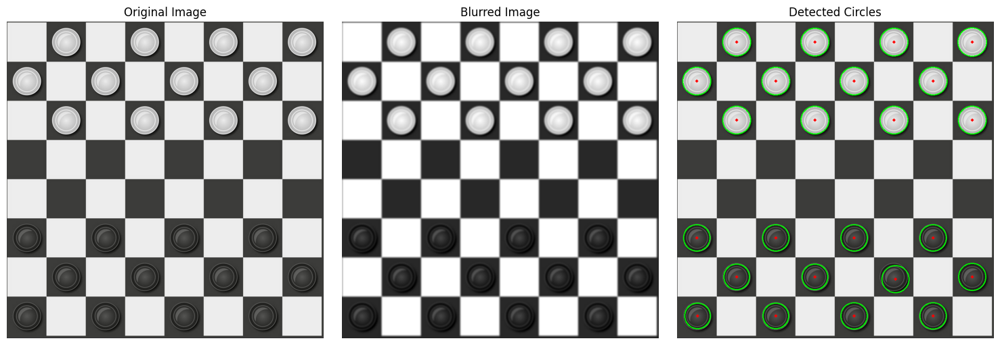

Circles detected:
Circle 1: Center = (470, 576), Radius = 35
Circle 2: Center = (784, 262), Radius = 37
Circle 3: Center = (366, 54), Radius = 37
Circle 4: Center = (158, 54), Radius = 37
Circle 5: Center = (262, 576), Radius = 35
Circle 6: Center = (52, 158), Radius = 37
Circle 7: Center = (576, 54), Radius = 37
Circle 8: Center = (470, 158), Radius = 37
Circle 9: Center = (784, 54), Radius = 38
Circle 10: Center = (262, 158), Radius = 37
Circle 11: Center = (366, 262), Radius = 37
Circle 12: Center = (52, 576), Radius = 35
Circle 13: Center = (680, 784), Radius = 35
Circle 14: Center = (470, 784), Radius = 35
Circle 15: Center = (680, 576), Radius = 35
Circle 16: Center = (158, 262), Radius = 37
Circle 17: Center = (680, 158), Radius = 37
Circle 18: Center = (576, 262), Radius = 37
Circle 19: Center = (158, 680), Radius = 34
Circle 20: Center = (262, 784), Radius = 34
Circle 21: Center = (366, 680), Radius = 34
Circle 22: Center = (54, 784), Radius = 34
Circle 23: Center = (784, 680)

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Load the image
# Ensure the file path is correct
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\checkers.png')

# Step 2: Convert the image to grayscale
# Hough Circle Transform works on grayscale images
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 3: Apply Gaussian Blur
# Parameters: (ksize=(9, 9), sigmaX=2) -> The kernel size and sigma value for blurring
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

# Step 4: Apply the Hough Circle Transform
# Parameters:
# 1. `image`: Input grayscale image (after Gaussian blur)
# 2. `method`: Detection method (cv2.HOUGH_GRADIENT is the only available method)
# 3. `dp`: Inverse ratio of the accumulator resolution to the image resolution (suggested values: 1-2)
# 4. `minDist`: Minimum distance between the centers of detected circles (in pixels)
# 5. `param1`: Higher threshold for the Canny edge detector (suggested values: 100-200)
# 6. `param2`: Accumulator threshold for circle detection. Smaller values detect more circles (suggested: 20-100)
# 7. `minRadius`: Minimum radius of circles to detect (in pixels)
# 8. `maxRadius`: Maximum radius of circles to detect (in pixels)
circles = cv2.HoughCircles(blurred, 
                           cv2.HOUGH_GRADIENT, 
                           dp=1, 
                           minDist=50, 
                           param1=50, 
                           param2=40, 
                           minRadius=30, 
                           maxRadius=80)

# Step 5: Draw the detected circles
# Copy the original image for drawing
output = image.copy()

# Ensure circles were detected
if circles is not None:
    # Convert circle parameters to integers
    circles = np.uint16(np.around(circles))
    for circle in circles[0, :]:
        # Draw the outer circle
        cv2.circle(output, (circle[0], circle[1]), circle[2], (0, 255, 0), 2)
        # Draw the center of the circle
        cv2.circle(output, (circle[0], circle[1]), 2, (0, 0, 255), 3)

# Step 6: Display the results
# Display original, blurred, and output image
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Blurred Image")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Detected Circles")
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

# Step 7: Print relevant information
# Print circle information if detected
if circles is not None:
    print("Circles detected:")
    for i, circle in enumerate(circles[0, :]):
        print(f"Circle {i + 1}: Center = ({circle[0]}, {circle[1]}), Radius = {circle[2]}")
else:
    print("No circles detected.")


# Harris Corner Detector

Loading the image...
Converting the image to grayscale for processing...
Applying Harris Corner Detection...
Harris Corner Detection parameters: block_size=2, ksize=3, k=0.04
Number of corners detected above the threshold: 188
Highlighting detected corners on the original image...
Sample coordinates of detected corners (first 10): [[213 591]
 [218 589]
 [221 597]
 [221 598]
 [232 594]
 [253 579]
 [254 577]
 [261 575]
 [261 576]
 [272 571]]
Displaying the grayscale image and corners detected...


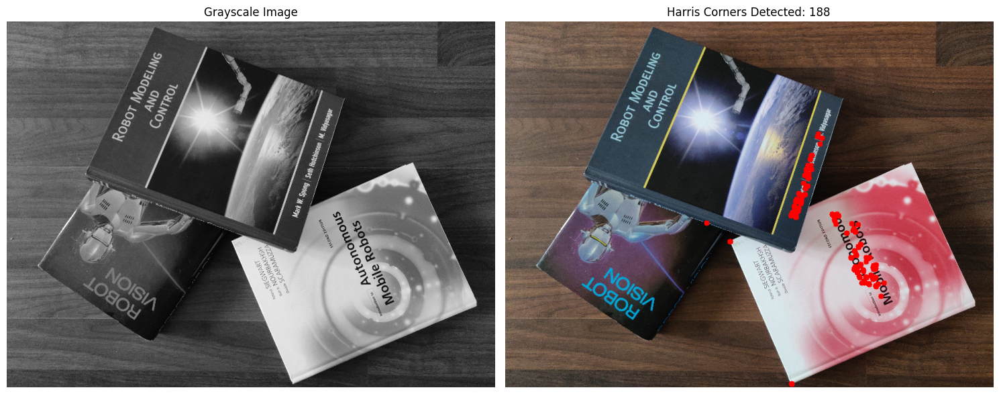

Successfully detected and highlighted 188 corners on the image.


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Load the image
print("Loading the image...")
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_10\books.png')

# Step 2: Convert the image to grayscale
print("Converting the image to grayscale for processing...")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 3: Apply Harris Corner Detection
print("Applying Harris Corner Detection...")
block_size = 2  # Size of the neighborhood considered for corner detection
ksize = 3  # Aperture parameter for Sobel operator
k = 0.04  # Harris detector free parameter
harris_corners = cv2.cornerHarris(src=gray_image, blockSize=block_size, ksize=ksize, k=k)
print(f"Harris Corner Detection parameters: block_size={block_size}, ksize={ksize}, k={k}")

# Step 4: Apply thresholding to identify significant corners
""" threshold = 0.01 * harris_corners.max()  # Threshold as a fraction of the maximum value
print(f"Threshold for significant corners: {threshold:.4f}") """
threshold = 0.01

above_threshold = np.sum(harris_corners > threshold)
print(f"Number of corners detected above the threshold: {above_threshold}")

# Step 5: Highlight corners on the original image
print("Highlighting detected corners on the original image...")
image_with_corners = image.copy()
corner_points = np.argwhere(harris_corners > threshold)  # Get coordinates of corners
print(f"Sample coordinates of detected corners (first 10): {corner_points[:10]}")

# Draw detected corners as red circles on the image
for point in corner_points:
    y, x = point
    cv2.circle(image_with_corners, (x, y), radius=5, color=(0, 0, 255), thickness=-1)

# Step 6: Display results using Matplotlib
print("Displaying the grayscale image and corners detected...")
plt.figure(figsize=(15, 10))

# Grayscale Image
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

# Harris Corners
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image_with_corners, cv2.COLOR_BGR2RGB))
plt.title(f'Harris Corners Detected: {above_threshold}')
plt.axis('off')

plt.tight_layout()
plt.show()

# Final printout
if above_threshold > 0:
    print(f"Successfully detected and highlighted {above_threshold} corners on the image.")
else:
    print("No significant corners were detected.")


# Shi-Tomasi

Loading the image...
Converting the image to grayscale for processing...
Applying Shi-Tomasi Corner Detection...
Shi-Tomasi parameters: max_corners=100, quality_level=0.01, min_distance=10
Number of corners detected: 100
Highlighting detected corners on the original image...
Sample coordinates of detected corners (first 10): [[668 482]
 [694 485]
 [662 441]
 [699 499]
 [686 495]
 [659 468]
 [680 482]
 [666 425]
 [425 415]
 [695 467]]
Displaying the grayscale image and corners detected...


C:\Users\User\AppData\Local\Temp\ipykernel_22448\3698428524.py:36: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)  # Convert corner coordinates to integers


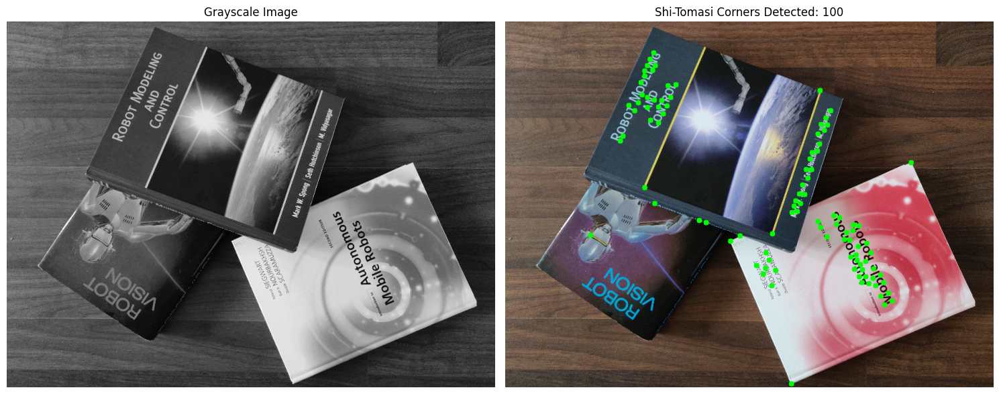

Successfully detected and highlighted 100 corners on the image.


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Load the image
print("Loading the image...")
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_10\books.png')

# Step 2: Convert the image to grayscale
print("Converting the image to grayscale for processing...")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 3: Apply Shi-Tomasi Corner Detection
print("Applying Shi-Tomasi Corner Detection...")
max_corners = 100  # Maximum number of corners to return
quality_level = 0.01  # Minimum accepted quality of corners (as a fraction of the max corner quality)
min_distance = 10  # Minimum distance between detected corners
corners = cv2.goodFeaturesToTrack(gray_image, 
                                   maxCorners=max_corners, 
                                   qualityLevel=quality_level, 
                                   minDistance=min_distance)
print(f"Shi-Tomasi parameters: max_corners={max_corners}, quality_level={quality_level}, min_distance={min_distance}")

# Step 4: Count detected corners
if corners is not None:
    num_corners = len(corners)
    print(f"Number of corners detected: {num_corners}")
else:
    num_corners = 0
    print("No corners detected.")

# Step 5: Highlight corners on the original image
print("Highlighting detected corners on the original image...")
image_with_corners = image.copy()
if corners is not None:
    corners = np.int0(corners)  # Convert corner coordinates to integers
    print(f"Sample coordinates of detected corners (first 10): {corners[:10].reshape(-1, 2)}")
    for corner in corners:
        x, y = corner.ravel()  # Flatten the array to get x, y coordinates
        cv2.circle(image_with_corners, (x, y), radius=5, color=(0, 255, 0), thickness=-1)

# Step 6: Display results using Matplotlib
print("Displaying the grayscale image and corners detected...")
plt.figure(figsize=(15, 10))

# Grayscale Image
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

# Shi-Tomasi Corners
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image_with_corners, cv2.COLOR_BGR2RGB))
plt.title(f'Shi-Tomasi Corners Detected: {num_corners}')
plt.axis('off')

plt.tight_layout()
plt.show()

# Final printout
if num_corners > 0:
    print(f"Successfully detected and highlighted {num_corners} corners on the image.")
else:
    print("No significant corners were detected.")


## Harris - Shi Tomasi Comparison

Loading the image...
Converting the image to grayscale...
Applying Harris Corner Detection...
Harris Corner Detection:
  Parameters: block_size=2, ksize=3, k=0.04
  Threshold: 0.0100
  Number of corners detected: 188
  Sample corners (first 10): [[213 591]
 [218 589]
 [221 597]
 [221 598]
 [232 594]
 [253 579]
 [254 577]
 [261 575]
 [261 576]
 [272 571]]

Applying Shi-Tomasi Corner Detection...
Shi-Tomasi Corner Detection:
  Parameters: max_corners=100, quality_level=0.01, min_distance=10
  Number of corners detected: 100
  Sample corners (first 10): [[668 482]
 [694 485]
 [662 441]
 [699 499]
 [686 495]
 [659 468]
 [680 482]
 [666 425]
 [425 415]
 [695 467]]


C:\Users\User\AppData\Local\Temp\ipykernel_22448\1208904847.py:47: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  shi_corners = np.int0(shi_corners)


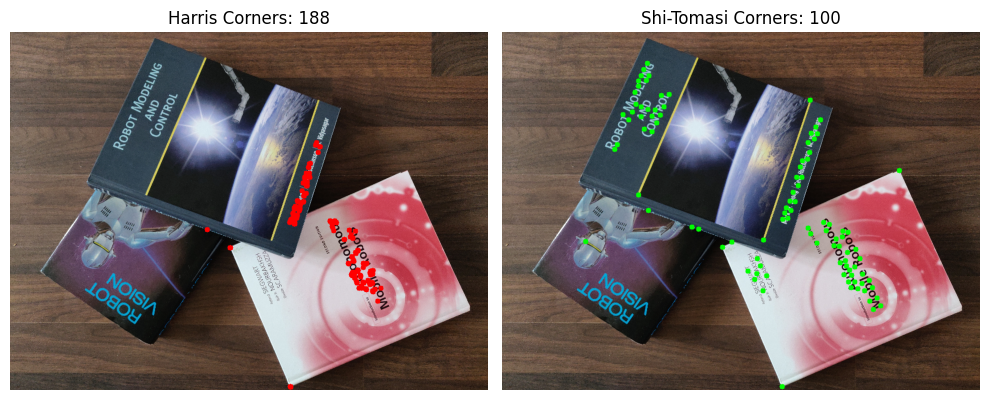

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
print("Loading the image...")
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_10\books.png')

# Convert the image to grayscale
print("Converting the image to grayscale...")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Harris Corner Detection
print("Applying Harris Corner Detection...")
harris_block_size = 2
harris_ksize = 3
harris_k = 0.04
harris_threshold = 0.01  # Threshold for significant corners

harris_corners = cv2.cornerHarris(src=gray_image, blockSize=harris_block_size, ksize=harris_ksize, k=harris_k)
harris_threshold_value = harris_threshold
harris_points = np.argwhere(harris_corners > harris_threshold_value)

# Draw Harris corners
image_harris = image.copy()
for point in harris_points:
    y, x = point
    cv2.circle(image_harris, (x, y), radius=5, color=(0, 0, 255), thickness=-1)

# Print Harris metrics
print(f"Harris Corner Detection:")
print(f"  Parameters: block_size={harris_block_size}, ksize={harris_ksize}, k={harris_k}")
print(f"  Threshold: {harris_threshold_value:.4f}")
print(f"  Number of corners detected: {len(harris_points)}")
print(f"  Sample corners (first 10): {harris_points[:10]}")

# Shi-Tomasi Corner Detection
print("\nApplying Shi-Tomasi Corner Detection...")
shi_max_corners = 100
shi_quality_level = 0.01
shi_min_distance = 10

shi_corners = cv2.goodFeaturesToTrack(gray_image, maxCorners=shi_max_corners, qualityLevel=shi_quality_level, minDistance=shi_min_distance)
image_shi = image.copy()

if shi_corners is not None:
    shi_corners = np.int0(shi_corners)
    for corner in shi_corners:
        x, y = corner.ravel()
        cv2.circle(image_shi, (x, y), radius=5, color=(0, 255, 0), thickness=-1)

# Print Shi-Tomasi metrics
print(f"Shi-Tomasi Corner Detection:")
print(f"  Parameters: max_corners={shi_max_corners}, quality_level={shi_quality_level}, min_distance={shi_min_distance}")
print(f"  Number of corners detected: {len(shi_corners)}")
print(f"  Sample corners (first 10): {shi_corners[:10].reshape(-1, 2)}")

# Visual comparison of results
plt.figure(figsize=(10, 5))

# Harris corners
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image_harris, cv2.COLOR_BGR2RGB))
plt.title(f'Harris Corners: {len(harris_points)}')
plt.axis('off')

# Shi-Tomasi corners
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image_shi, cv2.COLOR_BGR2RGB))
plt.title(f'Shi-Tomasi Corners: {len(shi_corners)}')
plt.axis('off')

plt.tight_layout()
plt.show()


# Optical flow

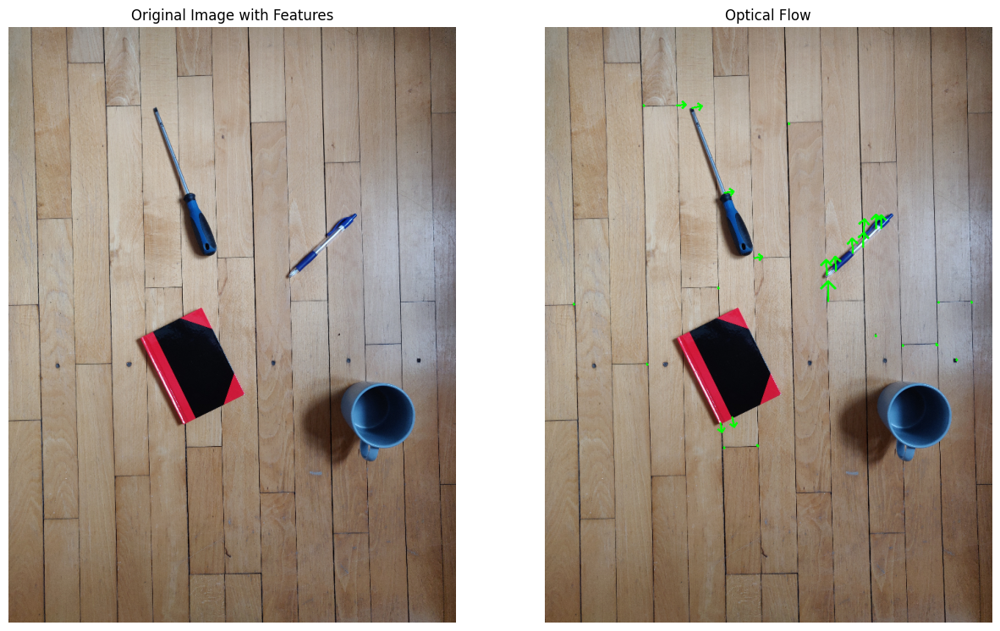

Number of features detected: 27
Number of valid optical flow points: 27
Maximum horizontal movement (x direction): 15.6368408203125 pixels
Maximum vertical movement (y direction): 30.4580078125 pixels
Sample feature points and their movements (x, y):
Feature 0: Start=(271.00, 613.00), End=(273.77, 627.68), Movement=(2.77, 14.68)
Feature 1: Start=(475.00, 350.00), End=(474.99, 328.98), Movement=(-0.01, -21.02)
Feature 2: Start=(267.00, 403.00), End=(268.60, 405.71), Movement=(1.60, 2.71)
Feature 3: Start=(519.00, 312.00), End=(519.90, 292.08), Movement=(0.90, -19.92)
Feature 4: Start=(323.00, 358.00), End=(335.87, 356.70), Movement=(12.87, -1.30)
Feature 5: Start=(511.00, 312.00), End=(511.73, 291.92), Movement=(0.73, -20.08)
Feature 6: Start=(327.00, 647.00), End=(329.15, 649.68), Movement=(2.15, 2.68)
Feature 7: Start=(607.00, 426.00), End=(608.48, 427.98), Movement=(1.48, 1.98)
Feature 8: Start=(510.00, 477.00), End=(511.69, 479.69), Movement=(1.69, 2.69)
Feature 9: Start=(492.00, 31

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the two images
image1 = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_12\things1.png')
image2 = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_12\things2.png')

# Convert the images to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Detect features on the first image using cv2.goodFeaturesToTrack
features = cv2.goodFeaturesToTrack(gray1, maxCorners=100, qualityLevel=0.3, minDistance=7)

# Apply sparse optical flow using cv2.calcOpticalFlowPyrLK
features_next, status, error = cv2.calcOpticalFlowPyrLK(gray1, gray2, features, None)

# Calculate movement in the x direction
movement_x = features_next[:, 0, 0] - features[:, 0, 0]  # x-coordinates difference
max_movement_x = np.max(np.abs(movement_x))  # Maximum horizontal movement

# Calculate movement in the y direction
movement_y = features_next[:, 0, 1] - features[:, 0, 1]  # y-coordinates difference
max_movement_y = np.max(np.abs(movement_y))  # Maximum vertical movement

# Visualize the optical flow
output_image = image1.copy()
for i, (pt1, pt2) in enumerate(zip(features, features_next)):
    if status[i]:  # Check if the flow is valid
        x1, y1 = pt1.ravel()
        x2, y2 = pt2.ravel()
        cv2.arrowedLine(output_image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2, tipLength=0.5)

# Display the results
plt.figure(figsize=(15, 10))

# Original features
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title('Original Image with Features')
plt.axis('off')

# Optical flow visualization
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title('Optical Flow')
plt.axis('off')

plt.show()

# Print relevant information
print(f"Number of features detected: {len(features)}")
print(f"Number of valid optical flow points: {np.sum(status)}")
print(f"Maximum horizontal movement (x direction): {max_movement_x} pixels")
print(f"Maximum vertical movement (y direction): {max_movement_y} pixels")
print("Sample feature points and their movements (x, y):")
for i, (pt1, pt2) in enumerate(zip(features, features_next)):
    x1, y1 = pt1.ravel()
    x2, y2 = pt2.ravel()
    print(f"Feature {i}: Start=({x1:.2f}, {y1:.2f}), End=({x2:.2f}, {y2:.2f}), Movement=({x2-x1:.2f}, {y2-y1:.2f})")


# SIFT

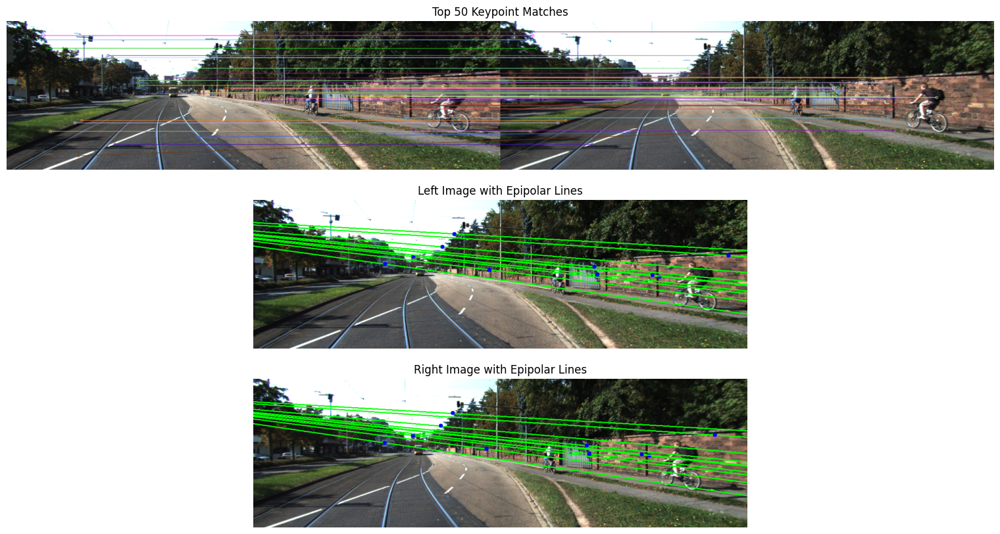

===== Key Information =====
Number of keypoints in Left Image: 4271
Number of keypoints in Right Image: 4069
Number of matches: 2000
Number of inlier matches: 1550
Fundamental Matrix (F):
[[-4.31502025e-08  1.93532552e-04 -3.22243053e-03]
 [-1.89493243e-04  6.18930148e-05 -1.41101170e-01]
 [ 4.06345166e-03  1.21551070e-01  1.00000000e+00]]
===== Epipolar Line Information =====
Average Epipolar Line Coefficients (Right Image): [ 0.11572549 -0.9919066  94.89586   ]
Average Epipolar Line Coefficients (Left Image): [ -0.10871917   0.9929217  -96.73851   ]
Sample Epipolar Lines (Right Image):
[[ 1.00121602e-01 -9.94975209e-01  8.50540466e+01]
 [ 1.27078131e-01 -9.91892695e-01  1.02104065e+02]
 [ 1.17334567e-01 -9.93092418e-01  9.59431000e+01]
 [ 1.05738901e-01 -9.94393945e-01  8.86083069e+01]
 [ 8.88957679e-02 -9.96040940e-01  7.79489899e+01]]
Sample Epipolar Lines (Left Image):
[[-9.53163058e-02  9.95447040e-01 -8.68722458e+01]
 [-1.19636528e-01  9.92817760e-01 -1.04807365e+02]
 [-1.109973

In [28]:
import cv2
import matplotlib.pyplot as plt

# Load the two images
left_image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_18\left.png')
right_image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_18\right.png')

# Convert images to grayscale
gray_left = cv2.cvtColor(left_image, cv2.COLOR_BGR2GRAY)
gray_right = cv2.cvtColor(right_image, cv2.COLOR_BGR2GRAY)

# Create a SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
keypoints_left, descriptors_left = sift.detectAndCompute(gray_left, None)
keypoints_right, descriptors_right = sift.detectAndCompute(gray_right, None)

# Create a BFMatcher object for descriptor matching
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Match descriptors between the two images
matches = bf.match(descriptors_left, descriptors_right)

# Sort matches by distance (best matches first)
matches = sorted(matches, key=lambda x: x.distance)[:2000]

# Extract the matched keypoints
points_left = np.float32([keypoints_left[m.queryIdx].pt for m in matches])
points_right = np.float32([keypoints_right[m.trainIdx].pt for m in matches])

# Compute the Fundamental Matrix
F, inliers = cv2.findFundamentalMat(points_left, points_right, method=cv2.FM_RANSAC)

# Select inlier points
inliers = inliers.ravel() == 1
points_left_inliers = points_left[inliers]
points_right_inliers = points_right[inliers]

# Compute epipolar lines in both images
lines_right = cv2.computeCorrespondEpilines(points_left_inliers.reshape(-1, 1, 2), 1, F).reshape(-1, 3)
lines_left = cv2.computeCorrespondEpilines(points_right_inliers.reshape(-1, 1, 2), 2, F).reshape(-1, 3)

# Average coefficients of the epipolar lines
average_line_right = np.mean(lines_right, axis=0)
average_line_left = np.mean(lines_left, axis=0)

# Function to draw epipolar lines
def draw_epipolar_lines(img, lines, points):
    img_copy = img.copy()
    for r, pt in zip(lines[:10], points[:10]):  # Show only the first 10 for clarity
        a, b, c = r
        x0, y0 = 0, int(-c / b) if b != 0 else 0
        x1, y1 = img.shape[1], int(-(c + a * img.shape[1]) / b) if b != 0 else 0
        cv2.line(img_copy, (x0, y0), (x1, y1), (0, 255, 0), 2)
        cv2.circle(img_copy, tuple(np.int32(pt)), 5, (255, 0, 0), -1)
    return img_copy

# Draw epipolar lines on both images
left_with_lines = draw_epipolar_lines(left_image, lines_left, points_left_inliers)
right_with_lines = draw_epipolar_lines(right_image, lines_right, points_right_inliers)

# Match visualization
matched_image = cv2.drawMatches(
    left_image, keypoints_left, right_image, keypoints_right, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

# Display all visualizations
plt.figure(figsize=(20, 10))

# Match visualization
plt.subplot(3, 1, 1)
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.title('Top 50 Keypoint Matches')
plt.axis('off')

# Left image with epipolar lines
plt.subplot(3, 1, 2)
plt.imshow(cv2.cvtColor(left_with_lines, cv2.COLOR_BGR2RGB))
plt.title('Left Image with Epipolar Lines')
plt.axis('off')

# Right image with epipolar lines
plt.subplot(3, 1, 3)
plt.imshow(cv2.cvtColor(right_with_lines, cv2.COLOR_BGR2RGB))
plt.title('Right Image with Epipolar Lines')
plt.axis('off')

plt.show()

# Print all relevant information
print("===== Key Information =====")
print(f"Number of keypoints in Left Image: {len(keypoints_left)}")
print(f"Number of keypoints in Right Image: {len(keypoints_right)}")
print(f"Number of matches: {len(matches)}")
print(f"Number of inlier matches: {np.sum(inliers)}")
print(f"Fundamental Matrix (F):\n{F}")
print("===== Epipolar Line Information =====")
print(f"Average Epipolar Line Coefficients (Right Image): {average_line_right}")
print(f"Average Epipolar Line Coefficients (Left Image): {average_line_left}")
print(f"Sample Epipolar Lines (Right Image):\n{lines_right[:5]}")
print(f"Sample Epipolar Lines (Left Image):\n{lines_left[:5]}")

In [29]:
import math

p = 0.98
w = 0.75

k = (math.log(1-p))/(math.log(1-(w**2)))

print(k)

4.732217735314645


# K-means

File read successfully.
Calculating distortions for different numbers of clusters...


c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\s

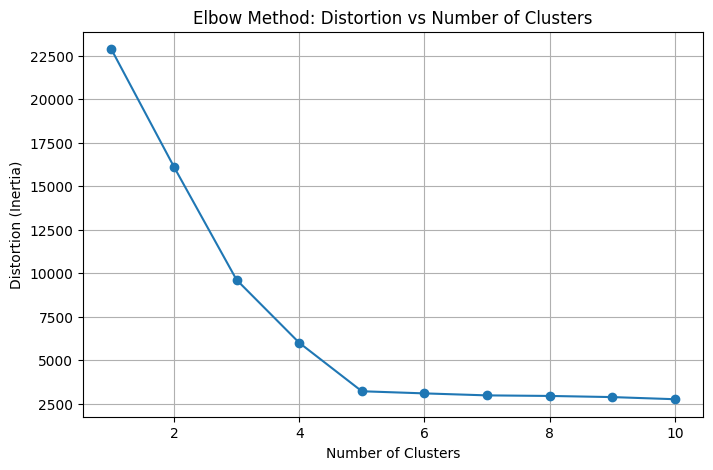

In [57]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 1: Read the data file
file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_23\clusters.txt'
file_pacth = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\data.txt'

try:
    # Load the file as a NumPy array
    data = np.loadtxt(file_path)
    print("File read successfully.")
except Exception as e:
    print(f"Error reading file: {e}")
    exit()

# Step 2: Validate the data
if data.size == 0:
    print("The file is empty or contains invalid data.")
    exit()

# Step 3: Apply K-Means clustering and calculate distortions
distortions = []
max_clusters = 10  # Maximum number of clusters to test
cluster_range = range(1, max_clusters + 1)

print("Calculating distortions for different numbers of clusters...")
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data)
    distortions.append(kmeans.inertia_)

# Step 4: Plot the elbow method
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, distortions, marker='o')
plt.title('Elbow Method: Distortion vs Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion (Inertia)')
plt.grid(True)
plt.show()


# PCA

File read successfully.
Performing PCA on the dataset...

Explained Variance by Each Principal Component:
Principal Component 1: 0.3954
Principal Component 2: 0.2777
Principal Component 3: 0.1624
Principal Component 4: 0.0803
Principal Component 5: 0.0207
Principal Component 6: 0.0182
Principal Component 7: 0.0155
Principal Component 8: 0.0118
Principal Component 9: 0.0100
Principal Component 10: 0.0079

Cumulative Explained Variance:
Up to Principal Component 1: 0.3954
Up to Principal Component 2: 0.6731
Up to Principal Component 3: 0.8356
Up to Principal Component 4: 0.9159
Up to Principal Component 5: 0.9366
Up to Principal Component 6: 0.9548
Up to Principal Component 7: 0.9703
Up to Principal Component 8: 0.9821
Up to Principal Component 9: 0.9921
Up to Principal Component 10: 1.0000


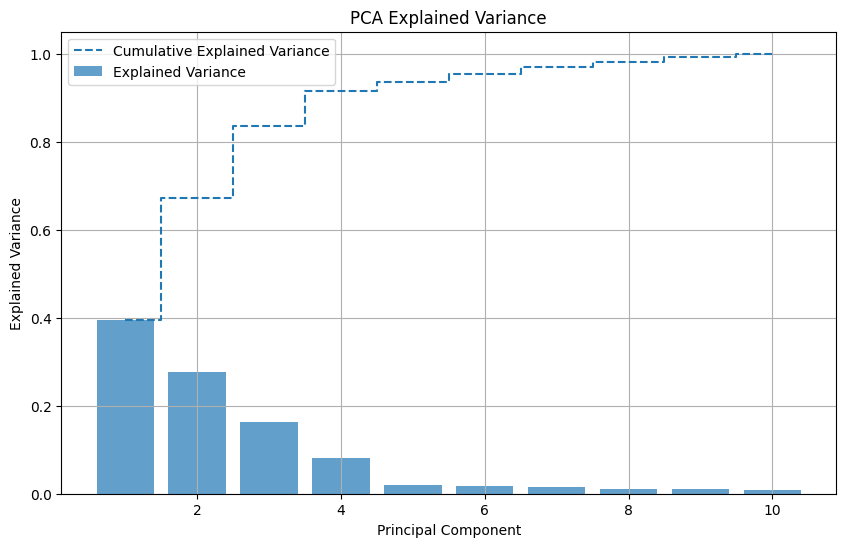

In [31]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Step 1: Read the data file
file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_23\clusters.txt'

try:
    # Load the file as a NumPy array
    data = np.loadtxt(file_path)
    print("File read successfully.")
except Exception as e:
    print(f"Error reading file: {e}")
    exit()

# Step 2: Validate the data
if data.size == 0:
    print("The file is empty or contains invalid data.")
    exit()

# Step 3: Perform PCA
print("Performing PCA on the dataset...")
pca = PCA()
pca.fit(data)

# Explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)


# Print numerical results
print("\nExplained Variance by Each Principal Component:")
for i, var in enumerate(explained_variance, start=1):
    print(f"Principal Component {i}: {var:.4f}")

print("\nCumulative Explained Variance:")
for i, cum_var in enumerate(cumulative_variance, start=1):
    print(f"Up to Principal Component {i}: {cum_var:.4f}")


# Step 4: Plot explained variance and cumulative variance
plt.figure(figsize=(10, 6))

# Plot individual explained variance
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, label='Explained Variance')

# Plot cumulative explained variance
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', label='Cumulative Explained Variance', linestyle='--')

plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('PCA Explained Variance')
plt.legend(loc='best')
plt.grid(True)
plt.show()


# PCA and K-Means

File read successfully.
Performing PCA on the dataset...

Applying K-Means with k = 5 on the PCA-transformed data...
Distortion/Inertia (Sum of squared distances to closest centroid): 3223.8500


c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


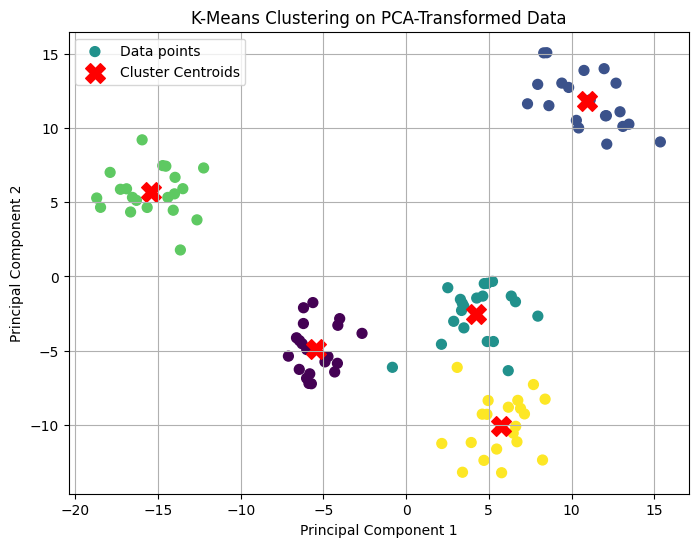

In [32]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 1: Read the data file
file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_23\clusters.txt'

try:
    # Load the file as a NumPy array
    data = np.loadtxt(file_path)
    print("File read successfully.")
except Exception as e:
    print(f"Error reading file: {e}")
    exit()

# Step 2: Validate the data
if data.size == 0:
    print("The file is empty or contains invalid data.")
    exit()

# Step 3: Perform PCA
print("Performing PCA on the dataset...")
pca = PCA()
pca_transformed = pca.fit_transform(data)

# Step 4: Perform K-Means clustering on the PCA-transformed data
k = 5  # Number of clusters
print(f"\nApplying K-Means with k = {k} on the PCA-transformed data...")
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(pca_transformed)

# Calculate distortion (inertia)
distortion = kmeans.inertia_
print(f"Distortion/Inertia (Sum of squared distances to closest centroid): {distortion:.4f}")

# Step 5: Plot the PCA-transformed data with K-Means cluster labels
plt.figure(figsize=(8, 6))
plt.scatter(
    pca_transformed[:, 0], 
    pca_transformed[:, 1], 
    c=kmeans.labels_, 
    cmap='viridis', 
    s=50, 
    label='Data points'
)
plt.scatter(
    kmeans.cluster_centers_[:, 0], 
    kmeans.cluster_centers_[:, 1], 
    c='red', 
    marker='X', 
    s=200, 
    label='Cluster Centroids'
)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering on PCA-Transformed Data')
plt.legend()
plt.grid(True)
plt.show()


# Linear regression

Files read successfully.

Training Linear Regression model...

Linear Regression Model Details:
Intercept: 21.4158
Coefficient: 0.5162

Model Evaluation:
Mean Squared Error (MSE): 5.5997
R-squared (R2 Score): 0.6465


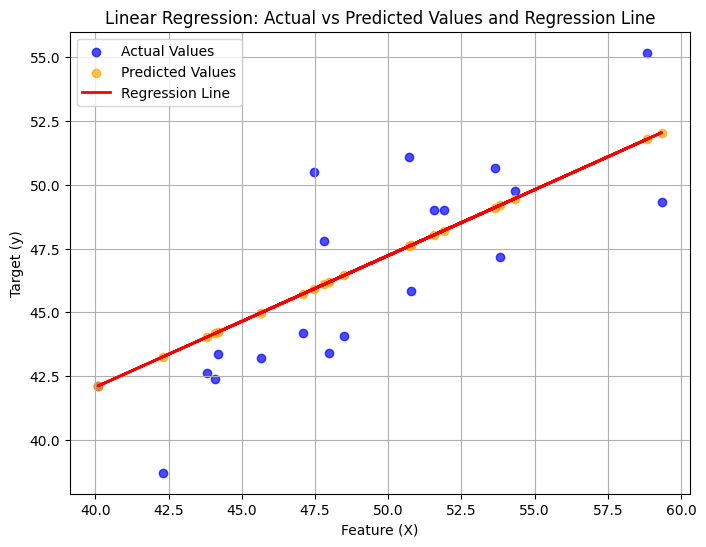

In [34]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Step 1: Read the data files
x_file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_24\lr_x.txt'
y_file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_24\lr_y.txt'

try:
    # Load the X and y files as NumPy arrays
    X = np.loadtxt(x_file_path).reshape(-1, 1)  # Ensure X is 2D for sklearn
    y = np.loadtxt(y_file_path)
    print("Files read successfully.")
except Exception as e:
    print(f"Error reading files: {e}")
    exit()

# Step 2: Validate the data
if X.size == 0 or y.size == 0:
    print("One or both files are empty or contain invalid data.")
    exit()

if len(X) != len(y):
    print("The number of rows in X and y do not match.")
    exit()

# Step 3: Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 4: Apply Linear Regression
print("\nTraining Linear Regression model...")
model = LinearRegression()
model.fit(X_train, y_train)

# Step 5: Print model details
print("\nLinear Regression Model Details:")
print(f"Intercept: {model.intercept_:.4f}")
print(f"Coefficient: {model.coef_[0]:.4f}")

# Step 6: Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("\nModel Evaluation:")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R-squared (R2 Score): {r2:.4f}")

# Step 7: Plot Actual vs Predicted values and the regression line
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, color='blue', alpha=0.7, label='Actual Values')
plt.scatter(X_test, y_pred, color='orange', alpha=0.7, label='Predicted Values')
plt.plot(X_test, y_pred, color='red', label='Regression Line', linewidth=2)
plt.xlabel('Feature (X)')
plt.ylabel('Target (y)')
plt.title('Linear Regression: Actual vs Predicted Values and Regression Line')
plt.legend()
plt.grid(True)
plt.show()

# Kalman Filter

In [43]:
import numpy as np

# Initial state vector (position and velocity in x and y directions)
x = 3
vx = 0.5
y = 2
vy = 0.33

state = np.array([x, vx, y, vy]).reshape(-1, 1)  # Reshape to column vector for matrix operations

# Initial covariance matrix
covariance = np.array([
    [5, 1, 0, 0],
    [1, 2, 0, 0],
    [0, 0, 5, 1],
    [0, 0, 1, 2]
])

# External forces and noise
u = np.zeros((4, 1))  # No external forces
Q = np.zeros((4, 4))  # Process noise

# Time step
dt = 1

# State transition matrix (F)
F = np.array([
    [1, dt, 0,  0],
    [0,  1, 0,  0],
    [0,  0, 1, dt],
    [0,  0, 0,  1]
])

# Measurement matrix (H) - Maps state space to measurement space (only x and y)
H = np.array([
    [1, 0, 0, 0],
    [0, 0, 1, 0]
])

""" # Prediction step (state and covariance)
predicted_state = F @ state + u
predicted_covariance = F @ covariance @ F.T + Q """

# Manual predicted state and covariance
predicted_state = np.array([5, 0.5, 7, 0.8]).reshape(-1, 1)
predicted_covariance = np.array([
    [0.2, 0, 0, 0],
    [0.2, 0.1, 0, 0],
    [0, 0, 0.2, 0],
    [0, 0, 0.2, 0.1]
])

# Simulated measurement (only x and y positions)
measurement = np.array([4.8, 7.1]).reshape(-1, 1)  # Adjusted to include only x and y

# Observation/measurement noise (R)
R = np.array([
    [0.2, 0.2],
    [0.2, 0.2]
])

# Update step
y_tilde = measurement - H @ predicted_state  # Measurement residual
S = H @ predicted_covariance @ H.T + R      # Residual covariance
K = predicted_covariance @ H.T @ np.linalg.inv(S)  # Kalman Gain
updated_state = predicted_state + K @ y_tilde     # Updated state
updated_covariance = (np.eye(4) - K @ H) @ predicted_covariance  # Updated covariance

# Printing the steps
print("Initial State:")
print(state)

print("\nState Transition Matrix (F):")
print(F)

print("\nPredicted State (x'):")  # Predicted state
print(predicted_state)

print("\nPredicted Covariance (P'):")  # Predicted covariance
print(predicted_covariance)

print("\nMeasurement:")  # Measurement
print(measurement)

print("\nMeasurement Residual (y_tilde):")  # Residual between measurement and prediction
print(y_tilde)

print("\nResidual Covariance (S):")  # Covariance of the residual
print(S)

print("\nKalman Gain (K):")  # Kalman gain
print(K)

print("\nUpdated State (x):")  # Updated state
print(updated_state)

print("\nUpdated Covariance (P):")  # Updated covariance
print(updated_covariance)


Initial State:
[[3.  ]
 [0.5 ]
 [2.  ]
 [0.33]]

State Transition Matrix (F):
[[1 1 0 0]
 [0 1 0 0]
 [0 0 1 1]
 [0 0 0 1]]

Predicted State (x'):
[[5. ]
 [0.5]
 [7. ]
 [0.8]]

Predicted Covariance (P'):
[[0.2 0.  0.  0. ]
 [0.2 0.1 0.  0. ]
 [0.  0.  0.2 0. ]
 [0.  0.  0.2 0.1]]

Measurement:
[[4.8]
 [7.1]]

Measurement Residual (y_tilde):
[[-0.2]
 [ 0.1]]

Residual Covariance (S):
[[0.4 0.2]
 [0.2 0.4]]

Kalman Gain (K):
[[ 0.66666667 -0.33333333]
 [ 0.66666667 -0.33333333]
 [-0.33333333  0.66666667]
 [-0.33333333  0.66666667]]

Updated State (x):
[[4.83333333]
 [0.33333333]
 [7.13333333]
 [0.93333333]]

Updated Covariance (P):
[[0.06666667 0.         0.06666667 0.        ]
 [0.06666667 0.1        0.06666667 0.        ]
 [0.06666667 0.         0.06666667 0.        ]
 [0.06666667 0.         0.06666667 0.1       ]]


# SVM

In [44]:
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
import numpy as np

# Step 1: Load the Dataset
x = np.loadtxt(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_29\svm_x.txt', dtype=float)
y = np.loadtxt(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_29\svm_y.txt', dtype=int)

print("Dataset loaded successfully.")
print(f"Shape of X (features): {x.shape}")
print(f"Shape of y (labels): {y.shape}")

# Step 2: Split the Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1337)

print("\nData split into training and testing sets.")
print(f"Number of training samples: {X_train.shape[0]}")
print(f"Number of testing samples: {X_test.shape[0]}")

# Step 3: Apply Support Vector Machine with Linear Kernel
clf = svm.SVC(kernel='linear')
clf.fit(X_train, y_train)

print("\nSVM model trained with a linear kernel.")

# Step 4: Make Predictions
y_pred = clf.predict(X_test)

# Step 5: Evaluate the Model
accuracy = metrics.accuracy_score(y_test, y_pred)

print("\nModel Evaluation:")
print("Predicted labels (y_pred):")
print(y_pred)
print("\nActual labels (y_test):")
print(y_test)
print(f"\nAccuracy: {accuracy:.4f}")


Dataset loaded successfully.
Shape of X (features): (569, 30)
Shape of y (labels): (569,)

Data split into training and testing sets.
Number of training samples: 398
Number of testing samples: 171

SVM model trained with a linear kernel.

Model Evaluation:
Predicted labels (y_pred):
[1 1 1 1 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0
 1 0 1 1 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1
 1 1 1 1 1 1 0 0 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1
 1 1 1 1 1 0 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1 0 1 0 0 1 1 1 0 1 0 1 1 0 1 0 1
 1 0 1 1 0 1 1 1 0 1 0 0 0 0 0 0 0 1 1 0 1 1 0]

Actual labels (y_test):
[1 1 1 1 0 1 0 1 0 1 0 0 0 0 1 1 0 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0
 1 0 1 1 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1
 1 1 1 1 1 1 0 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1
 1 1 1 1 1 0 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 1 0 1 0 1 0 1 1 0 1 0 1
 1 0 1 1 0 1 1 0 0 1 0 1 0 1 0 0 0 1 1 0 1 

# Stereo Visual Odometry

In [55]:
import glob
import cv2
import numpy as np
def extract_keypoints_sift(img1, img2, K, baseline):

    sift = cv2.SIFT_create()
    
    # Find keypoints and descriptors directly
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)
    
    # Match the points in each image with FLANN
    # parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)   # or pass empty dictionary
    
    # Match the points
    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    
    # Need to take only the good matches
    match_points1 = list()
    match_points2 = list()
    for i, (m1,m2) in enumerate(matches):
        if m1.distance < 0.7 * m2.distance:
            match_points1.append(kp1[m1.queryIdx].pt)
            match_points2.append(kp2[m1.trainIdx].pt)
    
    # p1 and p2 as arrays
    p1 = np.array(match_points1).astype(float)
    p2 = np.array(match_points2).astype(float)

    # projection matrix for Left and Right Image
    M_left = K.dot(np.hstack((np.eye(3), np.zeros((3, 1)))))
    M_rght = K.dot(np.hstack((np.eye(3), np.array([[-baseline, 0, 0]]).T)))

    p1_flip = np.vstack((p1.T, np.ones((1, p1.shape[0]))))
    p2_flip = np.vstack((p2.T, np.ones((1, p2.shape[0]))))

    P = cv2.triangulatePoints(M_left, M_rght, p1_flip[:2], p2_flip[:2])

    # Normalize homogeneous coordinates (P->Nx4  [N,4] is the normalizer/scale)
    P = P / P[3]
    land_points = P[:3]

    return land_points.T, p1

def featureTracking(prev_img, next_img, prev_points, world_points):
    # Parameters for the optical flow
    params = dict(winSize=(21, 21),
                 maxLevel=3,
                 criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 30, 0.01))
    
    # Track the features in the next image
    next_points, matches, _ = cv2.calcOpticalFlowPyrLK(prev_img, next_img, prev_points, None, **params)
    
    # Reshaping the matches list, and only sending back the points which have achiewed matches.
    matches = matches.reshape(matches.shape[0])

    return world_points[matches == 1], prev_points[matches == 1], next_points[matches == 1]


def playImageSequence(fname_L, fname_R, K):

    baseline = 0.54

    left_img  = cv2.imread(fname_L[1])
    right_img = cv2.imread(fname_R[1])
    left_img  = cv2.cvtColor(left_img, cv2.COLOR_BGR2GRAY)
    right_img = cv2.cvtColor(right_img, cv2.COLOR_BGR2GRAY)

    landmark_3D, reference_2D = extract_keypoints_sift(left_img, right_img, K, baseline)
    
    # reference
    reference_img = left_img

    # Groundtruth for plot
    traj = np.zeros((600, 600, 3), dtype=np.uint8)
    maxError = 0

    for (img_name_L, img_name_R) in zip(fname_L[2:], fname_R[2:]):
        # Load the current frame
        curImage   = cv2.imread(img_name_L)
        curImage_R = cv2.imread(img_name_R)
        curImage   = cv2.cvtColor(curImage, cv2.COLOR_BGR2GRAY)
        curImage_R = cv2.cvtColor(curImage_R, cv2.COLOR_BGR2GRAY)

        landmark_3D, reference_2D, tracked_2Dpoints = featureTracking(reference_img, 
                                                                      curImage, 
                                                                      reference_2D.astype('float32'),
                                                                      landmark_3D.astype('float32'))


        _, rvec, tvec, inliers = cv2.solvePnPRansac(landmark_3D, tracked_2Dpoints, K, None)

        rot, _ = cv2.Rodrigues(rvec)
        tvec = -rot.T.dot(tvec)  # coordinate transformation, from camera to world. What is the XYZ of the camera wrt World
        inv_transform = np.hstack((rot.T, tvec))  # inverse transform. A tranform projecting points from the camera frame to the world frame

        landmark_3D_new, reference_2D_new = extract_keypoints_sift(curImage, curImage_R, K, baseline)
        
        #Project the points from camera to world coordinates
        reference_2D = reference_2D_new.astype('float32')
        landmark_3D = inv_transform.dot(np.vstack((landmark_3D_new.T, np.ones((1, landmark_3D_new.shape[0])))))
        landmark_3D = landmark_3D.T

        reference_img = curImage

        print(tvec[0],tvec[1],tvec[2], rvec[0], rvec[1], rvec[2])

# Main entry point
fname_L = sorted(glob.glob(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_32\left\*.png'))
fname_R = sorted(glob.glob(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_32\right\*.png'))
K = np.array([[718.8560, 0.0, 607.1928], [0.0, 718.8560, 185.2157], [0.0, 0.0, 1.0]])

playImageSequence(fname_L, fname_R, K)


[-0.00888108] [-0.01300595] [0.59726464] [0.00281712] [0.00233042] [-0.00203677]
[-0.00929565] [-0.02884758] [1.16863353] [0.00247744] [0.00718937] [-0.00798121]
[-0.02406881] [-0.04786877] [1.72038474] [0.0006512] [0.01494963] [-0.01148168]
[-0.03875663] [-0.062823] [2.25661831] [-0.00298503] [0.0258702] [-0.0137339]
[-0.07606591] [-0.0762039] [2.77810413] [-0.00645515] [0.03977357] [-0.01396411]
[-0.12118609] [-0.0920828] [3.28139794] [-0.00849678] [0.05853344] [-0.01403776]
[-0.17549051] [-0.10523841] [3.78623127] [-0.00717097] [0.08040143] [-0.01716558]
[-0.24926685] [-0.12146549] [4.28548374] [-0.00410752] [0.10488244] [-0.0142616]
[-0.33475528] [-0.13511071] [4.77153494] [-0.00103389] [0.13299861] [-0.01392221]
[-0.42772361] [-0.14713135] [5.24759567] [-0.00064436] [0.1657261] [-0.01527667]
[-0.54642511] [-0.16852935] [5.69730933] [-0.00317264] [0.20223504] [-0.01175798]
[-0.69058995] [-0.17694228] [6.13767195] [-0.00730492] [0.24322769] [-0.0065307]
[-0.83825043] [-0.21740142] [

# Dis-similarity

In [59]:
import numpy as np

# Step 1: Define the matrices
A = np.array([[10, 15, 20],
              [20, 20, 25],
              [10, 15, 20]])

B = np.array([[15, 15, 15],
              [20, 20, 20],
              [30, 30, 30]])

# Step 2: Compute the Sum of Absolute Differences (SAD)
sad = np.sum(np.abs(A - B))  # Calculate absolute differences and sum them
print("SAD:", sad)

# Step 3: Compute the Sum of Squared Differences (SSD)
ssd = np.sum((A - B) ** 2)  # Calculate squared differences and sum them
print("SSD:", ssd)

# Step 4: Compute the means of A and B
mean_A = np.mean(A)  # Mean of matrix A
mean_B = np.mean(B)  # Mean of matrix B

# Step 5: Compute the numerator of NCC
numerator = np.sum((A - mean_A) * (B - mean_B))

# Step 6: Compute the denominator of NCC
denominator = np.sqrt(np.sum((A - mean_A) ** 2) * np.sum((B - mean_B) ** 2))

# Step 7: Compute NCC
ncc = numerator / denominator
print("NCC:", ncc)


SAD: 60
SSD: 800
NCC: -0.12427395320024001


# Cameras

## Camera matrix

In [64]:
import numpy as np

# Step 1: Define the rotation matrix (R), translation vector (T), and 3D point in world coordinates (P_w)
# Rotation matrix (R): Converts coordinates from the world coordinate system to the camera coordinate system.
R = np.array([[1, 0, 0],  # Identity rotation (no rotation)
              [0, 1, 0],
              [0, 0, 1]])
print("Rotation matrix (R):\n", R)
print("R represents the orientation of the camera relative to the world frame.\n")

# Translation vector (T): Shifts the origin of the world frame to the camera frame.
T = np.array([0, 0, 0])  # No translation (origin remains the same)
print("Translation vector (T):\n", T)
print("T represents the position of the camera relative to the world frame.\n")

# 3D point in world coordinates (P_w): Represents a point in the 3D world coordinate system.
P_w = np.array([1, 1, 3])  # Example 3D point
print("3D point in world coordinates (P_w):\n", P_w)
print("P_w is the point in the world coordinate system we want to project.\n")

# Step 2: Compute the 3D coordinates of the point in the camera coordinate system (P_c)
# Formula: P_c = R * P_w + T
P_c = np.dot(R, P_w) + T
print("3D coordinates in the camera coordinate system (P_c):\n", P_c)
print("P_c is the location of the point relative to the camera's frame of reference.\n")

# Step 3: Define the camera matrix (K)
# The camera matrix maps 3D points in the camera coordinate system to 2D points in the image (pixel coordinates).
K = np.array([[725, 0, 631],  # fx = 725 pixels, cx = 631 pixels
              [0, 726, 360],  # fy = 726 pixels, cy = 360 pixels
              [0, 0, 1]])      # Homogeneous coordinate term
print("Camera matrix (K):\n", K)
print("K represents the intrinsic parameters of the camera (focal lengths and principal point in pixels).\n")

# Step 4: Combine the intrinsic and extrinsic parameters to create the projection matrix (P)
# Concatenate R and T into a single 3x4 extrinsic matrix
RT = np.hstack((R, T.reshape(-1, 1)))
print("Extrinsic matrix [R | T]:\n", RT)
print("[R | T] combines the camera's rotation and translation.\n")

# Compute the projection matrix: P = K * [R | T]
P = np.dot(K, RT)
print("Projection matrix (P):\n", P)
print("P is the projection matrix that maps 3D world points directly to 2D image points.\n")

# Step 5: Project the 3D point in world coordinates to the image plane
# Convert P_w to homogeneous coordinates
P_w_homogeneous = np.append(P_w, 1)  # Append 1 to make it a 4D homogeneous vector
print("3D point in homogeneous world coordinates (P_w_homogeneous):\n", P_w_homogeneous)
print("Homogeneous coordinates are required for multiplication with the 3x4 projection matrix.\n")

# Compute the 2D point in homogeneous image coordinates
p = np.dot(P, P_w_homogeneous)
print("Projected point in homogeneous image coordinates (p):\n", p)
print("p represents the 2D image coordinates in homogeneous form.\n")

# Step 6: Normalize to get pixel coordinates
u = p[0] / p[2]  # Normalize by the third component
v = p[1] / p[2]
print("Pixel coordinates (u, v):\n", (u, v))
print("(u, v) represents the 2D pixel location of the point on the image plane in pixels.\n")


Rotation matrix (R):
 [[1 0 0]
 [0 1 0]
 [0 0 1]]
R represents the orientation of the camera relative to the world frame.

Translation vector (T):
 [0 0 0]
T represents the position of the camera relative to the world frame.

3D point in world coordinates (P_w):
 [1 1 3]
P_w is the point in the world coordinate system we want to project.

3D coordinates in the camera coordinate system (P_c):
 [1 1 3]
P_c is the location of the point relative to the camera's frame of reference.

Camera matrix (K):
 [[725   0 631]
 [  0 726 360]
 [  0   0   1]]
K represents the intrinsic parameters of the camera (focal lengths and principal point in pixels).

Extrinsic matrix [R | T]:
 [[1 0 0 0]
 [0 1 0 0]
 [0 0 1 0]]
[R | T] combines the camera's rotation and translation.

Projection matrix (P):
 [[725   0 631   0]
 [  0 726 360   0]
 [  0   0   1   0]]
P is the projection matrix that maps 3D world points directly to 2D image points.

3D point in homogeneous world coordinates (P_w_homogeneous):
 [1 1 3

# PnP solver

In [65]:
import numpy as np
import cv2  # OpenCV is used for Rodrigues' formula

# Given rvec (rotation vector) and tvec (translation vector)
rvec = np.array([-0.05, -1.51, -0.00])  # Rotation vector
tvec = np.array([87.39, -2.25, -24.89])  # Translation vector

# Convert rvec to a 3x3 rotation matrix using Rodrigues' formula
R, _ = cv2.Rodrigues(rvec)
print("Rotation matrix (R):\n", R)

# Given point in camera coordinates (P_c)
P_c = np.array([-6.71, 0.23, 21.59])  # Point in camera coordinates
print("Point in camera coordinates (P_c):\n", P_c)

# Compute the world coordinates (P_w)
P_w = np.dot(R.T, (P_c - tvec))
print("Point in world coordinates (P_w):\n", P_w)


Rotation matrix (R):
 [[ 0.0609624   0.03109396 -0.99765563]
 [ 0.03109396  0.9989704   0.03303495]
 [ 0.99765563 -0.03303495  0.0599328 ]]
Point in camera coordinates (P_c):
 [-6.71  0.23 21.59]
Point in world coordinates (P_w):
 [40.71158446 -1.98395975 96.74699786]
